Code inspired in https://github.com/ndahlquist/pytorch-fourier-feature-networks/blob/master/demo.ipynb

In [1]:
from PIL import Image
import requests
from io import BytesIO
import numpy as np
from tqdm.notebook import tqdm as tqdm
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import math

In [2]:
torch.__version__

'2.0.0rc5'

In [3]:
DEVICE = "cuda"

In [4]:
image_url = 'https://live.staticflickr.com/7492/15677707699_d9d67acf9d_b.jpg'
img_np = np.array(Image.open(BytesIO(requests.get(image_url).content)))

In [5]:
HEIGHT, WIDTH, CHANNELS = img_np.shape
HEIGHT, WIDTH, CHANNELS

(689, 1024, 3)

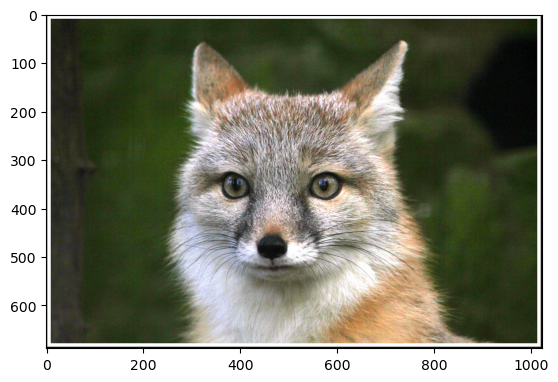

In [6]:
plt.imshow(img_np);

In [7]:
def plot_x(x_orig, num_cols, horiz_resolution=16):
        
    x = x_orig.clone()[0].cpu()
    
    num_rows = math.ceil(len(x) / num_cols)
    
    vert_resolution = (horiz_resolution * num_rows) / num_cols
    plt.figure(figsize=(horiz_resolution,vert_resolution))

    for i, img in enumerate(x):
        plt.subplot(num_rows, num_cols, i+1)
        plt.imshow(img)
        
    plt.show()
    
    
def plot_y(y_orig):
    
    y = y_orig.clone()[0].cpu()

    y *= 255
    #y[y > 255] = 255
    #y[y < 0] = 0
    y = y.type(torch.uint8).permute(1, 2, 0).cpu().numpy()
    
    plt.imshow(y)
    plt.show()

## Generate X data

In [8]:
x = torch.stack( torch.meshgrid(torch.linspace(start=0, end=1, steps=HEIGHT),
                                torch.linspace(start=0, end=1, steps=WIDTH)), 2).permute(2, 0, 1).unsqueeze(0).to(DEVICE)

print(x.shape)

torch.Size([1, 2, 689, 1024])


/usr/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /usr/src/debug/python-pytorch/pytorch-2.0.0rc5-opt-cuda/aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


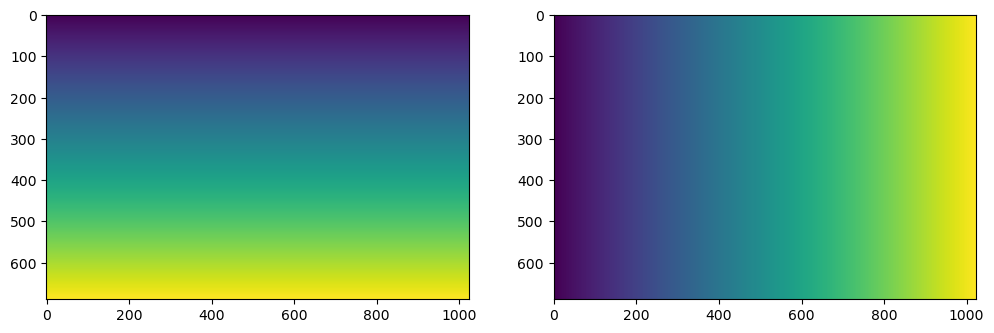

In [9]:
plot_x(x, num_cols=2, horiz_resolution=12)

## Generate y (normalized img)

In [10]:
y = torch.tensor(img_np, dtype=torch.float, device=DEVICE).permute(2, 0, 1).unsqueeze(0) / 255
y.shape

torch.Size([1, 3, 689, 1024])

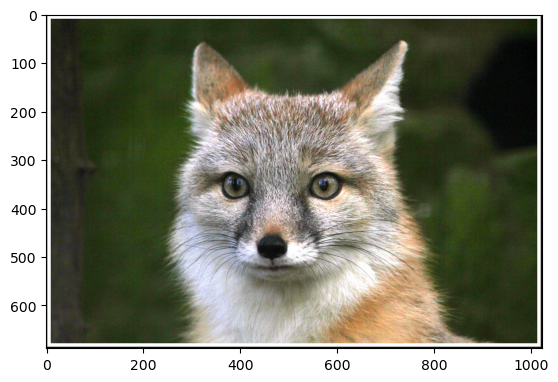

In [11]:
plot_y(y)

## Naive Model (without Fourier feats)

In [12]:
model = nn.Sequential(
    nn.Conv2d(   2, 256, kernel_size=1, padding=0), nn.ReLU(), nn.BatchNorm2d(256),
    nn.Conv2d( 256, 256, kernel_size=1, padding=0), nn.ReLU(), nn.BatchNorm2d(256),
    nn.Conv2d( 256, 256, kernel_size=1, padding=0), nn.ReLU(), nn.BatchNorm2d(256),
    nn.Conv2d( 256,   3, kernel_size=1, padding=0),
    nn.Sigmoid(),
).to(DEVICE)

## Train

Epoch 0, loss = 0.287


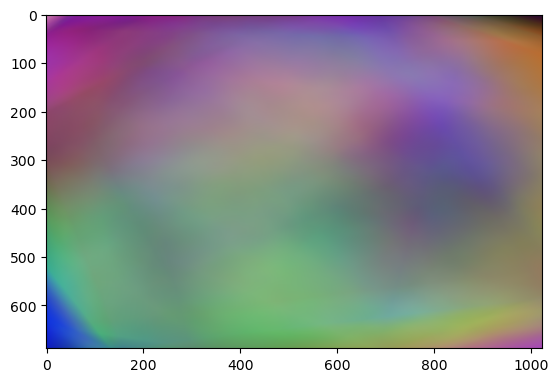

Epoch 200, loss = 0.107


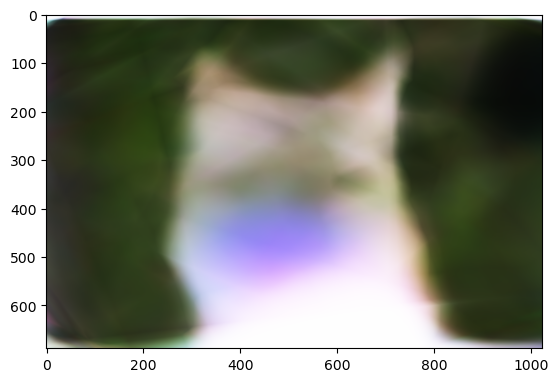

Epoch 400, loss = 0.085


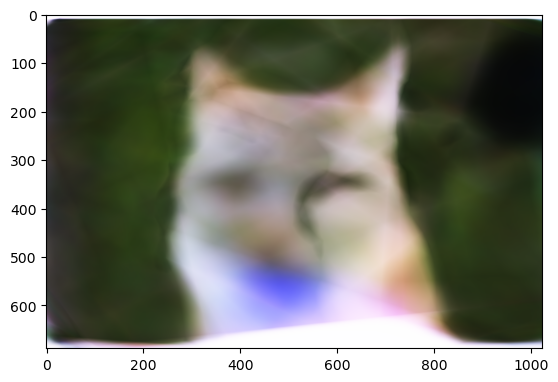

Epoch 600, loss = 0.070


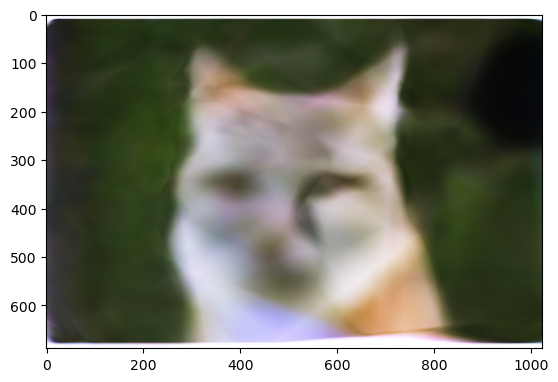

Epoch 800, loss = 0.064


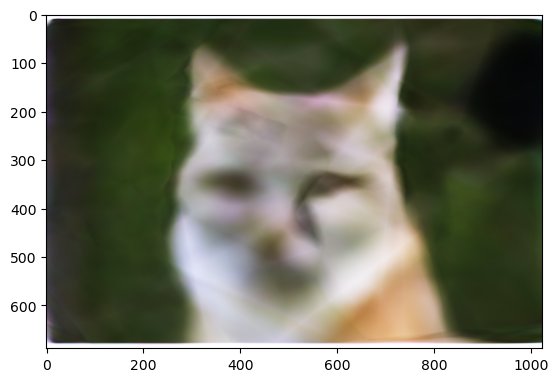

Epoch 1000, loss = 0.063


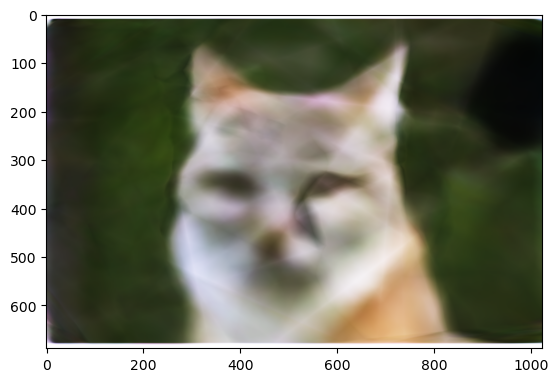

In [13]:
optimizer = torch.optim.Adam(list(model.parameters()), lr=1e-4)

for epoch in range(1001):
    optimizer.zero_grad()

    generated = model(x)

    loss = torch.nn.functional.l1_loss(y, generated)

    loss.backward()
    optimizer.step()

    if epoch % 200 == 0:
        print('Epoch %d, loss = %.03f' % (epoch, float(loss)))
        plot_y(generated)

plt.show()

# <center> Fourier feats
Paper: [Fourier Features Let Networks Learn High Frequency Functions in Low Dimensional Domains](https://arxiv.org/abs/2006.10739)
    
**Higher scale means more high frequencies waves, therefore, more finegrained details of image**

In [16]:
class GaussianFourierFeatureTransform(torch.nn.Module):
    """
    An implementation of Gaussian Fourier feature mapping.
    "Fourier Features Let Networks Learn High Frequency Functions in Low Dimensional Domains":
       https://arxiv.org/abs/2006.10739
       https://people.eecs.berkeley.edu/~bmild/fourfeat/index.html
    Given an input of size [batches, num_input_channels, width, height],
     returns a tensor of size [batches, mapping_size*2, width, height].
    """

    def __init__(self, num_input_channels, mapping_size=256, scale=10, learnable=False):
        super().__init__()

        self._num_input_channels = num_input_channels
        self._mapping_size = mapping_size
        if learnable:
            self._B = torch.nn.Parameter(data=torch.randn((num_input_channels, mapping_size)) * scale,
                                         requires_grad=True)
        else:
            self._B = torch.randn((num_input_channels, mapping_size)) * scale
        

    def forward(self, x):
        assert x.dim() == 4, 'Expected 4D input (got {}D input)'.format(x.dim())

        batches, channels, width, height = x.shape

        assert channels == self._num_input_channels,\
            "Expected input to have {} channels (got {} channels)".format(self._num_input_channels, channels)

        # Make shape compatible for matmul with _B.
        # From [B, C, W, H] to [(B*W*H), C].
        x = x.permute(0, 2, 3, 1).reshape(batches * width * height, channels)

        x = x @ self._B.to(x.device)

        x = x.view(batches, width, height, self._mapping_size) # From [(B*W*H), C] to [B, W, H, C]
        x = x.permute(0, 3, 1, 2)                              # From [B, W, H, C] to [B, C, W, H]

        x = 2 * math.pi * x
        return torch.cat([torch.sin(x), torch.cos(x)], dim=1)

In [17]:
x2 = GaussianFourierFeatureTransform(2, 128, 10)(x)

In [18]:
x2.shape, x2.mean(), x2.std(), x2.device

(torch.Size([1, 256, 689, 1024]),
 tensor(6.5391e-05, device='cuda:0'),
 tensor(0.7071, device='cuda:0'),
 device(type='cuda', index=0))

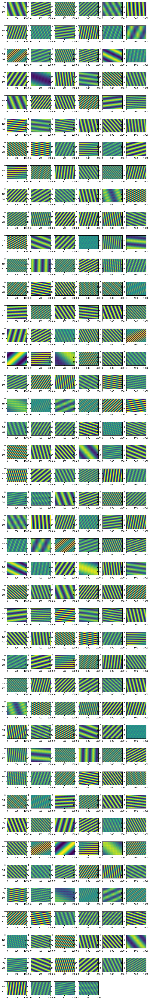

In [19]:
plot_x(x2, num_cols=6, horiz_resolution=12)

## Model 2: Fourier feats (with batchnorm)

In [18]:
model2 = nn.Sequential(
    nn.Conv2d( 256, 256, kernel_size=1, padding=0), nn.ReLU(), nn.BatchNorm2d(256),
    nn.Conv2d( 256, 256, kernel_size=1, padding=0), nn.ReLU(), nn.BatchNorm2d(256),
    nn.Conv2d( 256, 256, kernel_size=1, padding=0), nn.ReLU(), nn.BatchNorm2d(256),
    nn.Conv2d( 256,   3, kernel_size=1, padding=0),
    nn.Sigmoid(),
).to(DEVICE)

Epoch 0, loss = 0.308


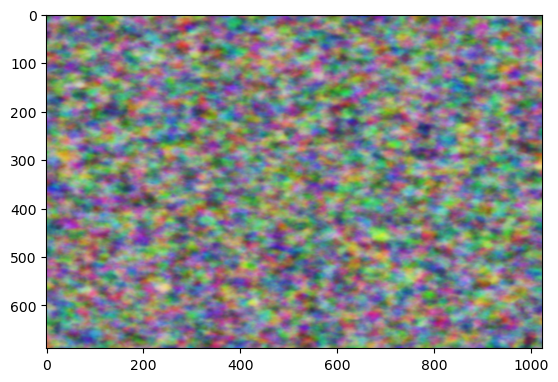

Epoch 100, loss = 0.101


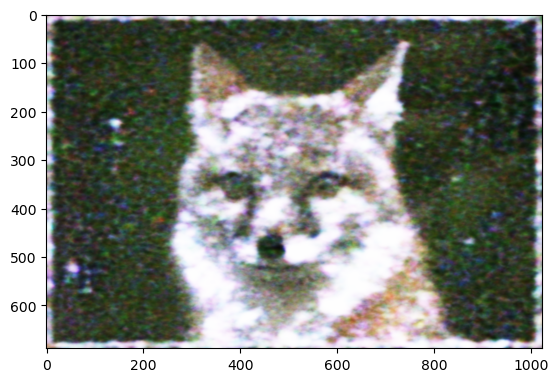

Epoch 200, loss = 0.060


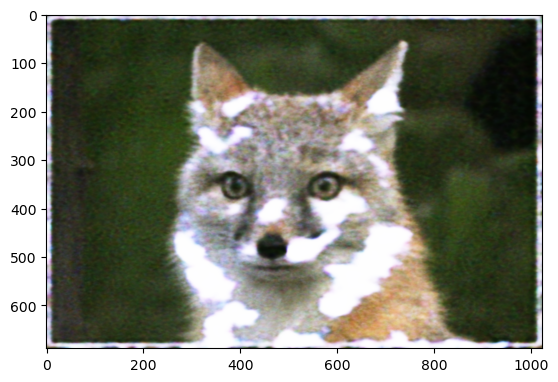

Epoch 300, loss = 0.050


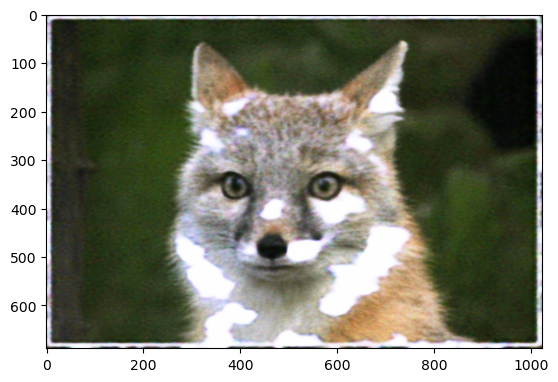

Epoch 400, loss = 0.044


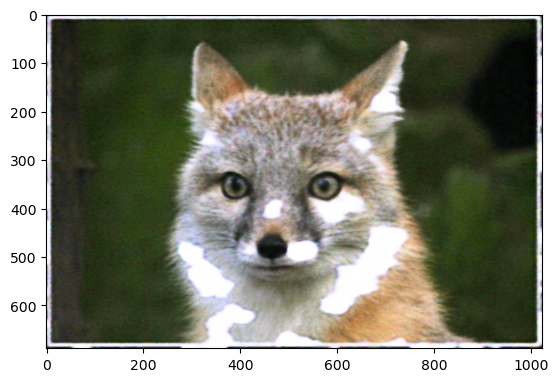

Epoch 500, loss = 0.039


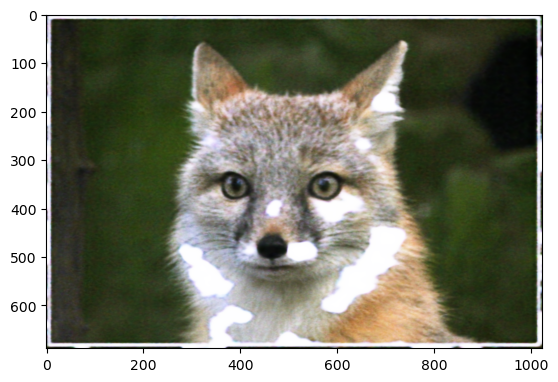

In [19]:
optimizer = torch.optim.Adam(list(model2.parameters()), lr=1e-4)

for epoch in range(501):
    optimizer.zero_grad()

    generated = model2(x2)

    loss = torch.nn.functional.l1_loss(y, generated)

    loss.backward()
    optimizer.step()

    if epoch % 100 == 0:
        print('Epoch %d, loss = %.03f' % (epoch, float(loss)))
        plot_y(generated)

plt.show()

## Model 3: Fourier feats (without batchnorm)


In [22]:
model3 = nn.Sequential(
    nn.Conv2d( 256, 256, kernel_size=1, padding=0), nn.ReLU(),
    nn.Conv2d( 256, 256, kernel_size=1, padding=0), nn.ReLU(),
    nn.Conv2d( 256, 256, kernel_size=1, padding=0), nn.ReLU(),
    nn.Conv2d( 256,   3, kernel_size=1, padding=0),
    nn.Sigmoid(),
).to(DEVICE)

Epoch 0, loss = 0.293


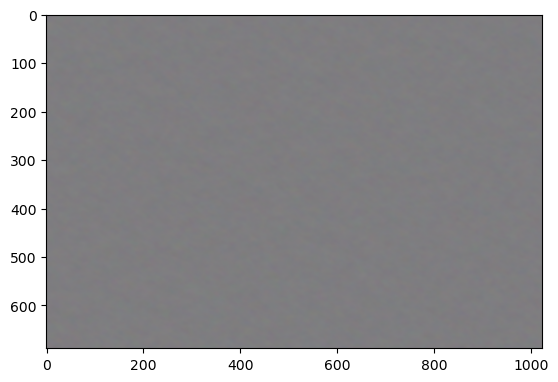

Epoch 100, loss = 0.221


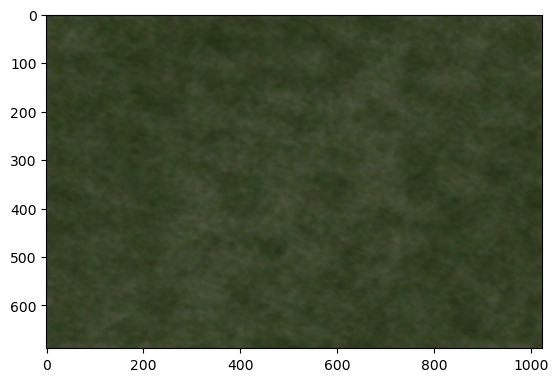

Epoch 200, loss = 0.209


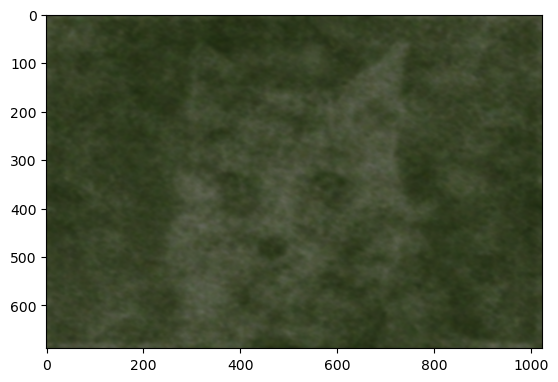

Epoch 300, loss = 0.133


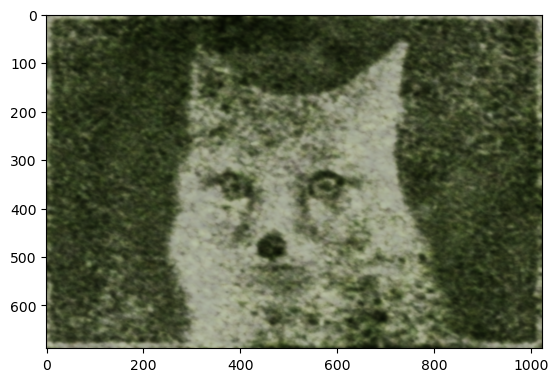

Epoch 400, loss = 0.059


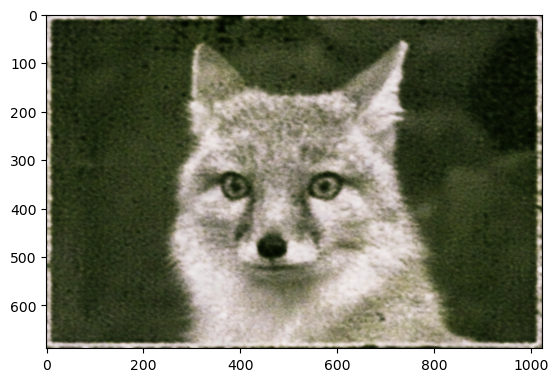

Epoch 500, loss = 0.050


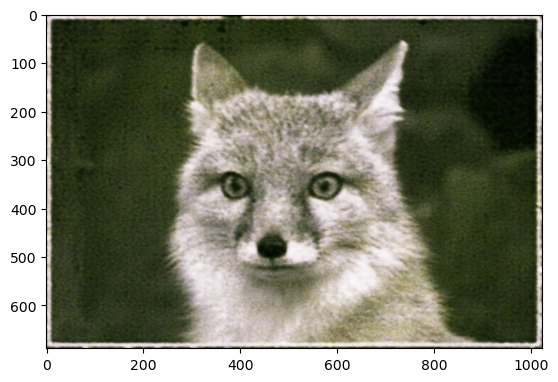

Epoch 600, loss = 0.045


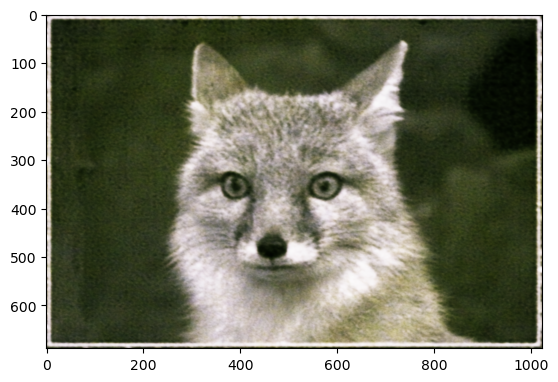

Epoch 700, loss = 0.042


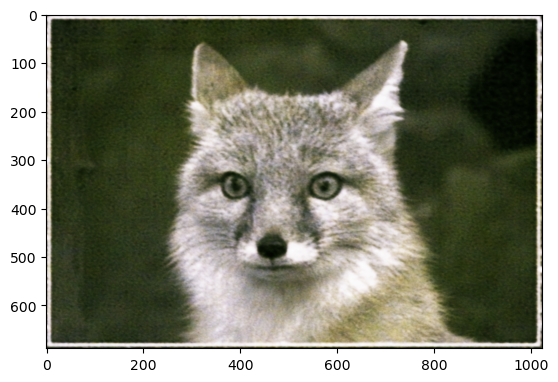

Epoch 800, loss = 0.040


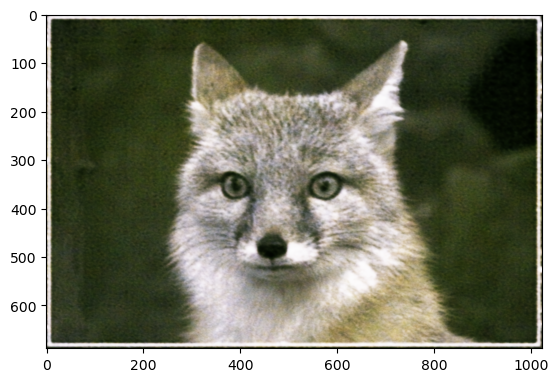

Epoch 900, loss = 0.038


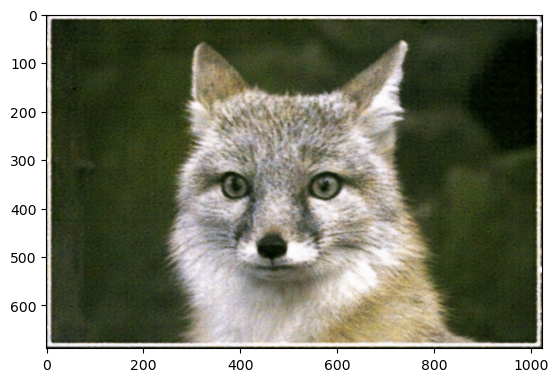

Epoch 1000, loss = 0.037


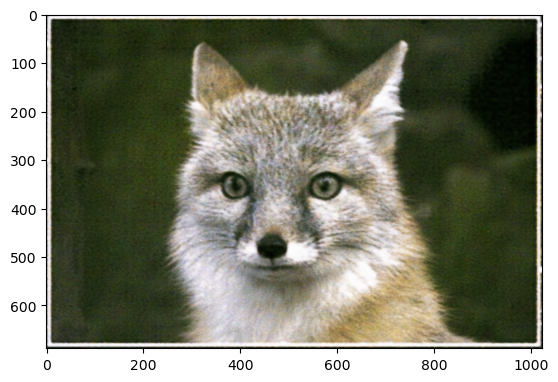

Epoch 1100, loss = 0.036


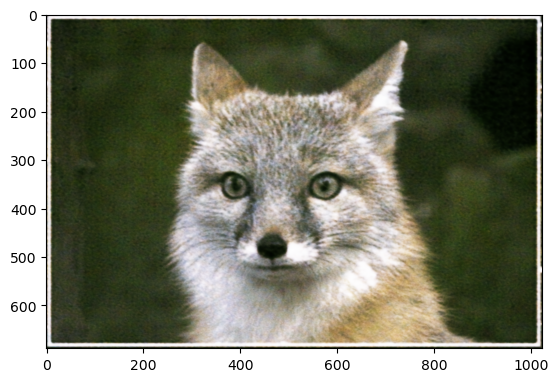

Epoch 1200, loss = 0.035


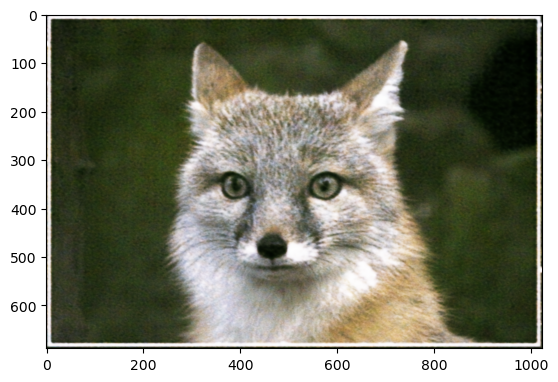

Epoch 1300, loss = 0.034


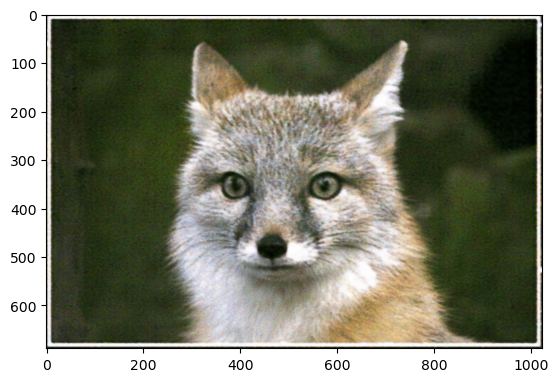

Epoch 1400, loss = 0.033


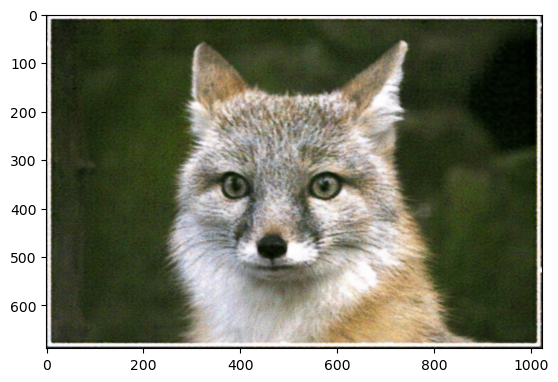

Epoch 1500, loss = 0.033


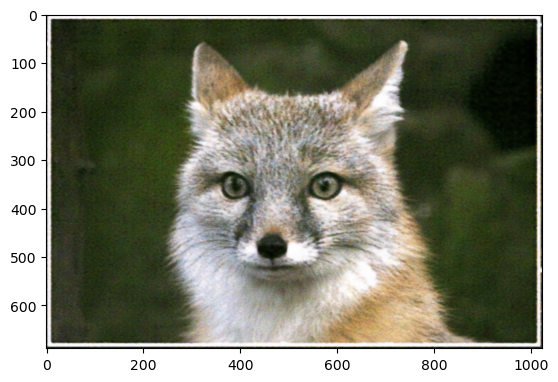

Epoch 1600, loss = 0.032


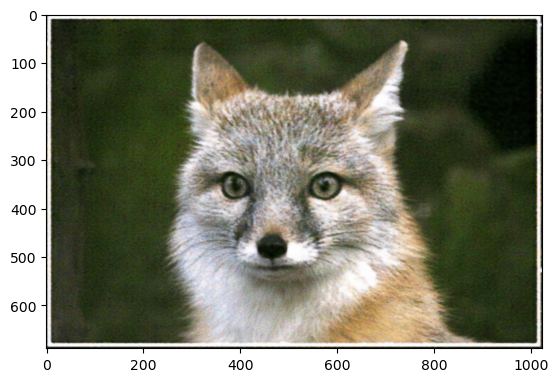

Epoch 1700, loss = 0.032


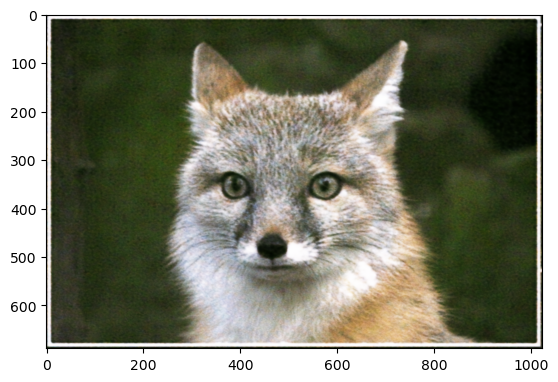

Epoch 1800, loss = 0.031


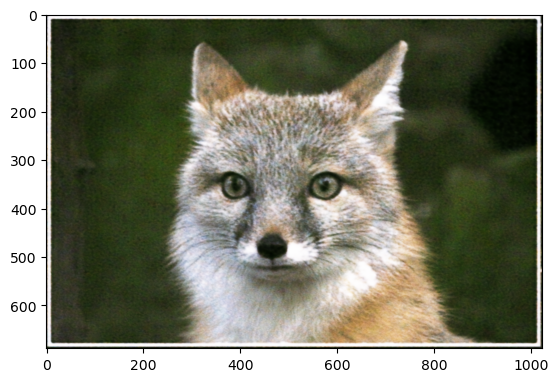

Epoch 1900, loss = 0.031


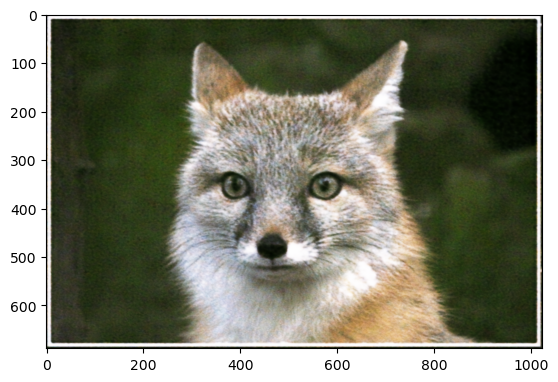

Epoch 2000, loss = 0.031


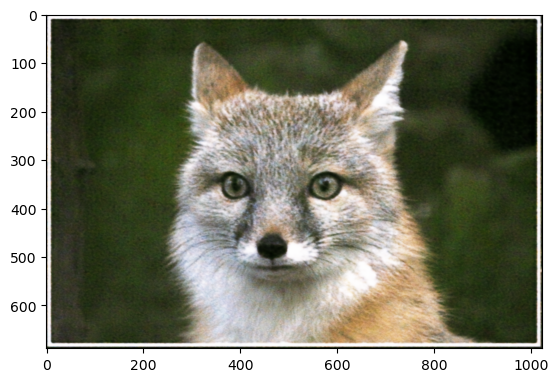

In [23]:
optimizer = torch.optim.Adam(list(model3.parameters()), lr=1e-4)

for epoch in range(2001):
    optimizer.zero_grad()

    generated = model3(x2)

    loss = torch.nn.functional.l1_loss(y, generated)

    loss.backward()
    optimizer.step()

    if epoch % 100 == 0:
        print('Epoch %d, loss = %.03f' % (epoch, float(loss)))
        plot_y(generated)

plt.show()

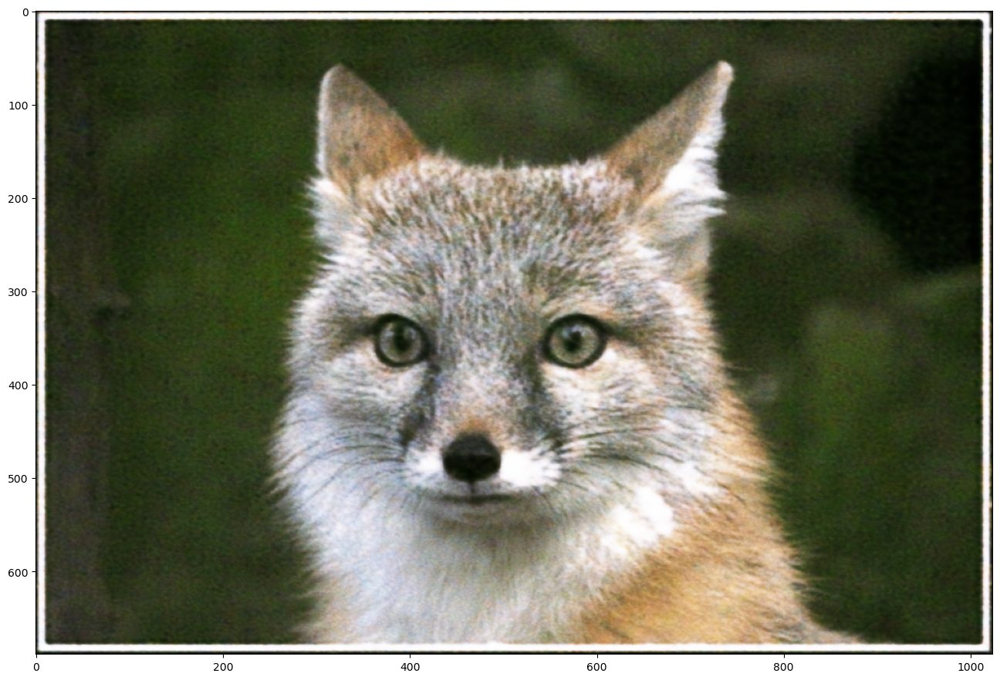

In [25]:
plt.figure(figsize=(16,12))
plot_y(generated)